<a href="https://colab.research.google.com/github/RemonMamdouhNagatyGerges/Arab-Image-captioning/blob/main/Computational_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Arabic Image Captioning

In [ ]:
!pip install -q kaggle

In [ ]:
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import cv2
import numpy as np
import glob
import os.path
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
import re
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
import pickle
from tensorflow.keras.utils import pad_sequences
import torch
from torch.nn.utils.rnn import pack_padded_sequence
from tqdm import tqdm
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import matplotlib.cm as cm
import skimage.transform
from PIL import Image
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torch.nn.functional as F

##Download data

In [ ]:
#download kaggle token
!gdown 19e-tCF7hKpnOhZgs_M6h_ZcmK-U4jyNp

Downloading...
From: https://drive.google.com/uc?id=19e-tCF7hKpnOhZgs_M6h_ZcmK-U4jyNp
To: /content/kaggle.json
100% 64.0/64.0 [00:00<00:00, 339kB/s]


In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download hsankesara/flickr-image-dataset

100% 8.16G/8.16G [01:43<00:00, 138MB/s]
100% 8.16G/8.16G [01:43<00:00, 85.1MB/s]


In [ ]:
#This will take approximately 2 mins
!unzip -q flickr-image-dataset.zip

##Exploring the data

In [ ]:
df = pd.read_csv('/content/flickr30k_images/results.csv', delimiter='|')
df.head()

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .


In [ ]:
df.columns

Index(['image_name', ' comment_number', ' comment'], dtype='object')

In [ ]:
#remove spaces from column names
df.columns = ['image_name', 'comment_number', 'comment']

In [ ]:
#check for null values
df.isna().sum()

image_name        0
comment_number    0
comment           1
dtype: int64

In [ ]:
#see row that has null value
# it is missing a | after number 4
df[df['comment'].isna()]

,image_name,comment_number,comment
19999,2199200615.jpg,4 A dog runs across the grass .,NaN


In [ ]:
#fix the above problem
line = df.loc[19999,'comment_number']
number = line[1]
comment = line[2:]

df.loc[19999,'comment_number'] = number
df.loc[19999,'comment'] = comment

In [ ]:
df.dtypes

image_name        object
comment_number    object
comment           object
dtype: object

In [ ]:
#convert image_name, comment to string and comment_number to int
df['image_name'] = df['image_name'].astype('str')
df['comment_number'] = df['comment_number'].astype('str').astype('int')
df['comment'] = df['comment'].astype('str')

In [ ]:
#find shortest/longest sentence length
df["Number of Words"] = df.comment.apply(lambda n: len(n.split()))
print("longest sentence length", df["Number of Words"].max())
print("shortest sentence length", df["Number of Words"].min())

longest sentence length 82
shortest sentence length 2


In [ ]:
#find if an image has less than 5 captions
# df.groupby(["image_name"]).sum().apply(lambda x: x)

Image shape  (500, 333, 3)


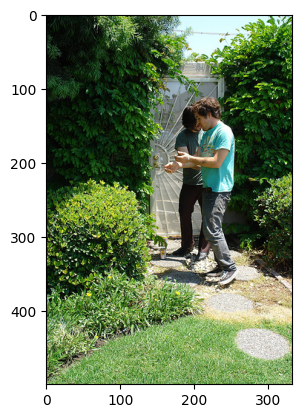

In [ ]:
#plot an image 
img_path = '/content/flickr30k_images/flickr30k_images/1000092795.jpg'
img = mpimg.imread(img_path)
print("Image shape ", img.shape)
plt.imshow(img)

In [ ]:
#check if all images have the same shape
#they do not have the same shape
directory = "/content/flickr30k_images/flickr30k_images/"
for filename in os.listdir(directory):
    fullFilename = os.path.join(directory, filename)
    img = mpimg.imread(fullFilename)
    if img.shape != (500, 333, 3):
      print(fullFilename, " has shape of ", img.shape)
      break

/content/flickr30k_images/flickr30k_images/2325816912.jpg  has shape of  (333, 500, 3)


## Images Preprocessing

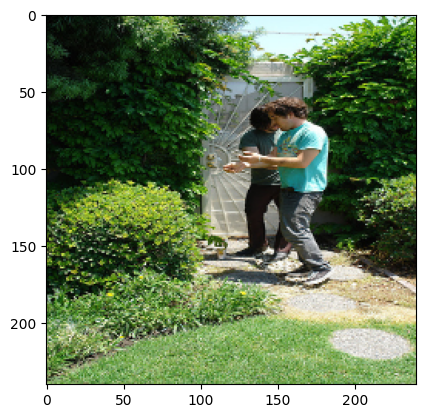

In [ ]:
#images resize
new_size = (240, 240)
img = cv2.imread(img_path)
resized_img = cv2.resize(img, new_size)
resized_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)
img_normalized = cv2.normalize(resized_img, None, 0, 1.0, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.imshow(img_normalized)

In [ ]:
print("before normalization min: ", np.min(resized_img), " max: ", np.max(resized_img))
print("after normalization min: ", np.min(img_normalized), " max: ", np.max(img_normalized))

before normalization min:  0  max:  255
after normalization min:  0.0  max:  1.0


In [ ]:
!rm -rf "/content/preprocessed_imgs/"

In [ ]:
!mkdir -p ./preprocessed_imgs

In [ ]:
#apply to all images
source_directory = "/content/flickr30k_images/flickr30k_images/"
destination_directory = "/content/preprocessed_imgs/"
for filename in os.listdir(source_directory):
  #only preprocess images (there is a csv in the source_directory)
  if filename[-3:] == "jpg":
    #read image
    source_fullFilename = os.path.join(source_directory, filename)
    img = mpimg.imread(source_fullFilename)
    #preprocess
    resized_img = cv2.resize(img, new_size)
    resized_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)
    img_normalized = cv2.normalize(resized_img, None, 0, 1.0, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    #save image
    destination_fullFilename = os.path.join(destination_directory, filename)
    cv2.imwrite(destination_fullFilename, img_normalized * 225)

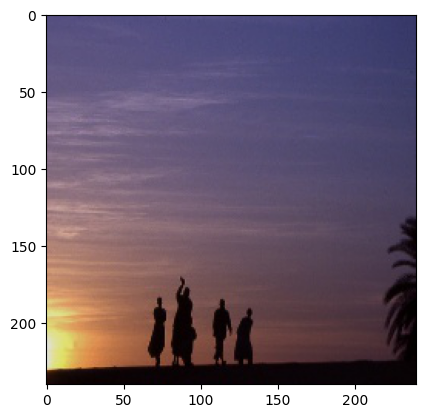

In [ ]:
#plot saved image
img = mpimg.imread("/content/preprocessed_imgs/100845130.jpg")
plt.imshow(img)
# img

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# !zip -r '/content/preprocessed_imgs.zip' '/content/preprocessed_imgs'
# !cp "/content/preprocessed_imgs.zip" "/content/drive/MyDrive"

##Captions Preprocessing

In [ ]:
#combine the captions of the same image in one list
captions = {}

for index, row in df.iterrows():
  image = row['image_name']
  comment = row['comment']

  #add comment to dictionary
  if image in captions:
    captions[image].append(comment)
  else:
    captions[image] = [comment]

In [ ]:
#before preprocessing
captions['1000092795.jpg']

[' Two young guys with shaggy hair look at their hands while hanging out in the yard .',
 ' Two young , White males are outside near many bushes .',
 ' Two men in green shirts are standing in a yard .',
 ' A man in a blue shirt standing in a garden .',
 ' Two friends enjoy time spent together .']

In [ ]:
#preprocess comments
for image_name, image_comments in captions.items():
  for i in range(len(image_comments)):
    comment = image_comments[i]
    #converting all letters to lowercase
    comment = comment.lower()
    #removing special charecters, punctuation marks, and numbers
    comment = re.sub(r'[^a-z | " "]+', '', comment)
    #remove extra spaces
    comment = comment.strip()
    comment = comment.replace('\s+', ' ')
    #add two tokens to each description ‘startseq’ and ‘endseq’ 
    preprocessed_comment = "startseq " + comment + " endseq"
    image_comments[i] = preprocessed_comment

In [ ]:
#after preprocessing
captions['1000092795.jpg']

['startseq two young guys with shaggy hair look at their hands while hanging out in the yard endseq',
 'startseq two young  white males are outside near many bushes endseq',
 'startseq two men in green shirts are standing in a yard endseq',
 'startseq a man in a blue shirt standing in a garden endseq',
 'startseq two friends enjoy time spent together endseq']

In [ ]:
#Tokenize captions
all_captions = [item for sublist in list(captions.values()) for item in sublist]
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)

In [ ]:
vocab_size = len(tokenizer.word_index)
print("Number of words = ", vocab_size)

Number of words =  19772


In [ ]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

80

In [ ]:
#save captions in a pickle to avoid re-running
with open('/content/captions.pickle', 'wb') as f:
    pickle.dump(captions, f)

##Train/val/test split

In [ ]:
#download features and captions pickle files
!gdown 1Lbx644iHl0Ch5CIJ5zNS_x2Huq90YYS2
!gdown 1-29HZK2DT136EUnKPgzbs4QZcBcv8NG4

Downloading...
From: https://drive.google.com/uc?id=1Lbx644iHl0Ch5CIJ5zNS_x2Huq90YYS2
To: /content/preprocessed_imgs.zip
100% 989M/989M [00:09<00:00, 104MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-29HZK2DT136EUnKPgzbs4QZcBcv8NG4
To: /content/captions.pickle
100% 13.5M/13.5M [00:00<00:00, 141MB/s]


In [ ]:
#unzip preprocessed images
!unzip -q "/content/preprocessed_imgs.zip" -d "/"

In [ ]:
#load captions from pickle file
with open('/content/captions.pickle', 'rb') as f:
    captions = pickle.load(f)

In [ ]:
images = list(captions.keys())

train_test_split = round(len(images)*0.90)
train_images = images[:train_test_split]
test_images = images[train_test_split:]

train_val_split = round(len(train_images)*0.90)
val_images = train_images[train_val_split:]
train_images = train_images[:train_val_split]

In [ ]:
print("Number of training samples: ", len(train_images))
print("Number of validation samples: ", len(val_images))
print("Number of testing samples: ", len(test_images))

Number of training samples:  25744
Number of validation samples:  2861
Number of testing samples:  3178


In [ ]:
train_image_captions = []
val_image_captions = []
test_image_captions = []

for i in train_images:
  train_image_captions.extend(captions[i])

for i in val_images:
  val_image_captions.extend(captions[i])

for i in test_images:
  test_image_captions.extend(captions[i])

In [ ]:
#Tokenize captions
all_captions = [item for sublist in list(captions.values()) for item in sublist]
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index)
max_length = max(len(caption.split()) for caption in all_captions)

##Create generator

In [ ]:
class CaptionDataset(Dataset):

    def __init__(self, imgs, caps, split):
        self.split = split
        assert self.split in {'TRAIN', 'VAL', 'TEST'}
        self.imgs = imgs
        self.cpi = 5
        self.captions = caps
        self.dataset_size = len(self.imgs)

    def __getitem__(self, i):
        # Remember, the Nth caption corresponds to the (N // captions_per_image)th image
        img = self.imgs[i // self.cpi]
        preprocessed_images = "/content/preprocessed_imgs"
        img_path = os.path.join(preprocessed_images, img)
        img_content = mpimg.imread(img_path)
        transform = transforms.ToTensor()
        torch_image = transform(img_content)

        # img_content = img_content.reshape((img_content.shape[2], img_content.shape[1], img_content.shape[0]))
        # imgs = torch.FloatTensor(img_content)

        caption_seq = tokenizer.texts_to_sequences([self.captions[i]])[0]
        caption_seq_padding = pad_sequences([caption_seq], maxlen=max_length, padding='post')[0]
        caption = torch.LongTensor(caption_seq_padding)
        caplen = torch.LongTensor([len(caption_seq)])

        if self.split == 'TRAIN':
            return torch_image, caption, caplen
        else:
            # For validation of testing, also return all 'captions_per_image' captions to find BLEU-4 score
            captions_for_image = self.captions[((i // self.cpi) * self.cpi):(((i // self.cpi) * self.cpi) + self.cpi)]
            all_captions = []
            for cfi in captions_for_image:
              caption_seq = tokenizer.texts_to_sequences([cfi])[0]
              caption_seq_padding = pad_sequences([caption_seq], maxlen=max_length, padding='post')[0]
              all_captions.append(caption_seq_padding)
            
            all_captions = torch.LongTensor(all_captions)
            return torch_image, caption, caplen, all_captions

    def __len__(self):
        return self.dataset_size

In [ ]:
batch_size = 64

In [ ]:
train_loader = torch.utils.data.DataLoader(
        CaptionDataset(train_images, train_image_captions, 'TRAIN'),
        batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)

In [ ]:
x, y, z = next(iter(train_loader))

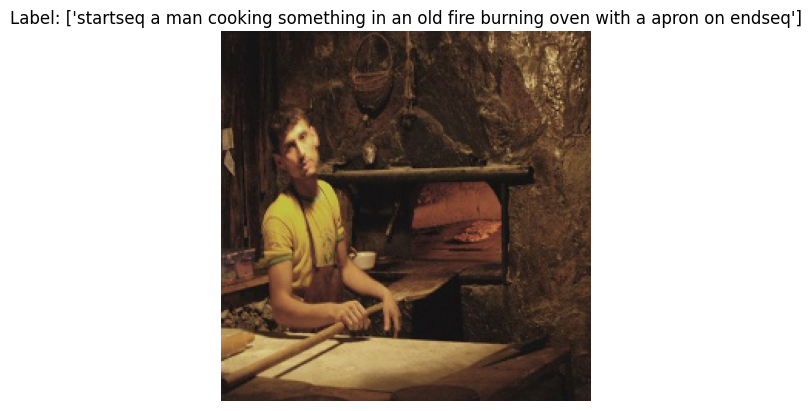

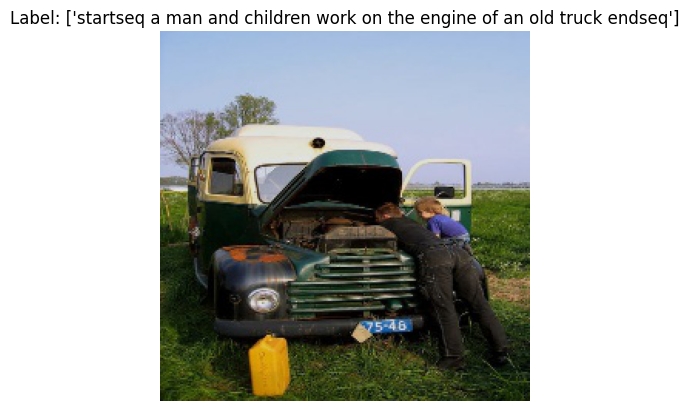

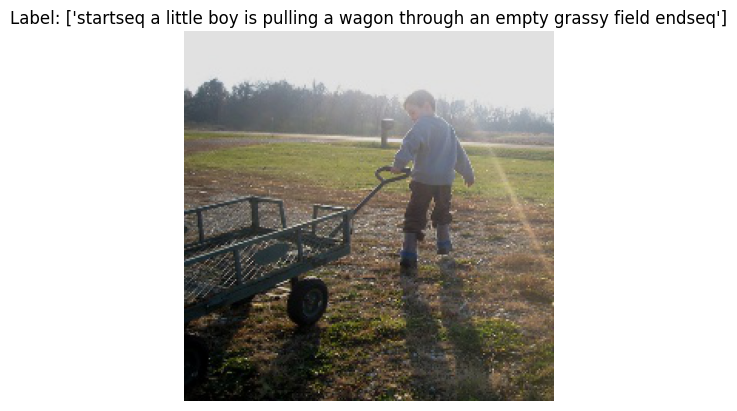

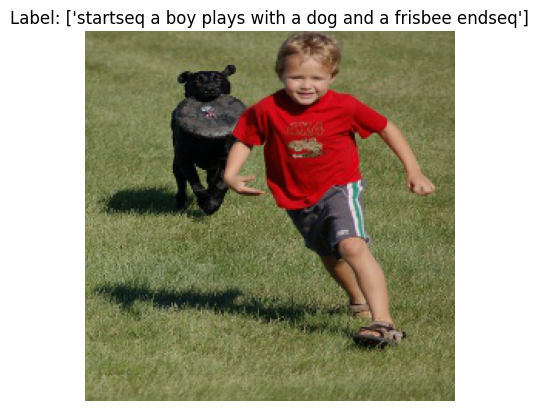

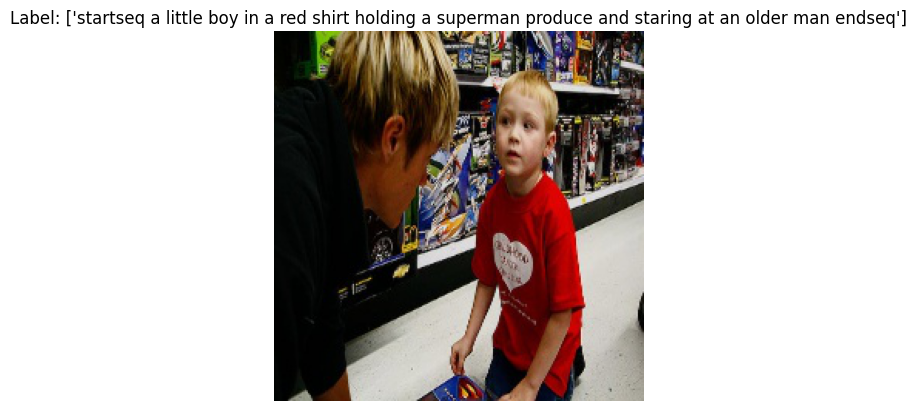

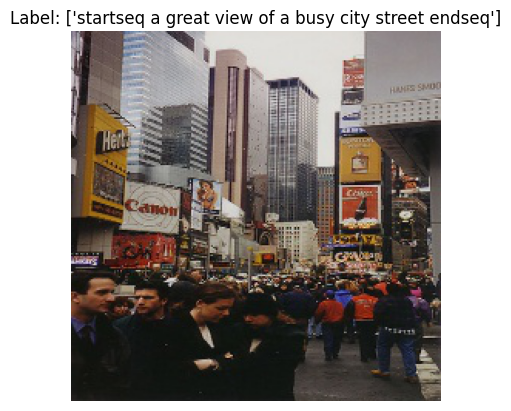

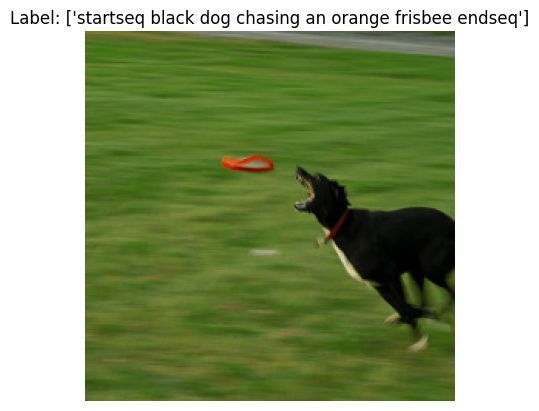

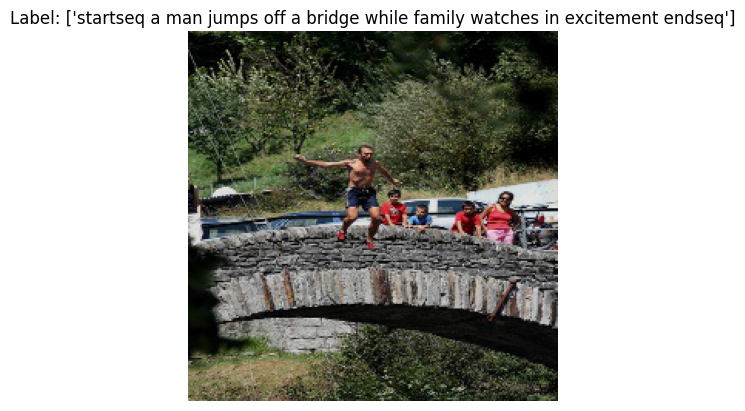

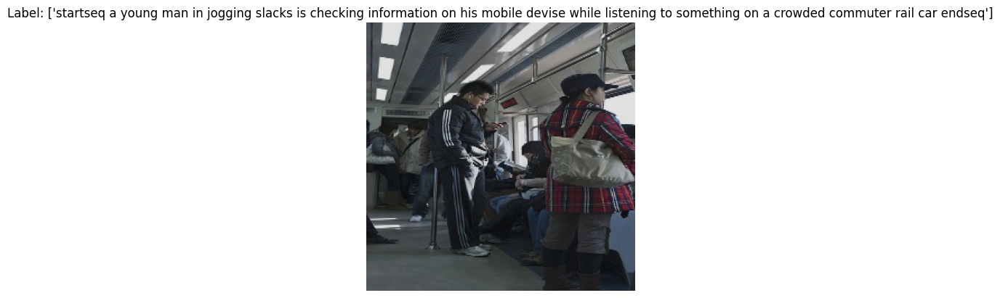

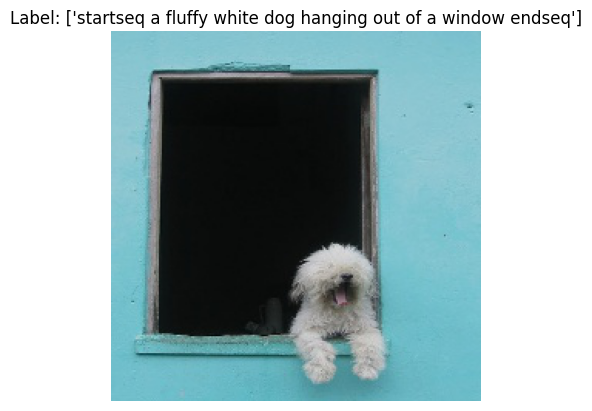

In [ ]:
num_images = 10

for i, (images, labels, l) in enumerate(train_loader):
    if i == num_images:
        break

    images = images.numpy()
    labels = labels.numpy()
    plt.imshow(((images[0].transpose(1, 2, 0))  * 255).astype(np.uint8))
    plt.title(f"Label: { tokenizer.sequences_to_texts([labels[0]])}")
    plt.axis('off')
    plt.show()

In [ ]:
val_loader = torch.utils.data.DataLoader(
    CaptionDataset(val_images, val_image_captions, 'VAL'),
    batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)

In [ ]:
x,y,z,u = next(iter(val_loader))

##Build model

In [ ]:
import torch
from torch import nn
import torchvision
from torchvision.models import ResNet101_Weights

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class Encoder(nn.Module):
    def __init__(self, encoded_image_size=14):
        super(Encoder, self).__init__()
        self.enc_image_size = encoded_image_size

        resnet = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)  # pretrained ImageNet ResNet-101

        # Remove linear and pool layers (since we're not doing classification)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Resize image to fixed size to allow input images of variable size
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

    def forward(self, images):
        out = self.resnet(images)  # (batch_size, 2048, image_size/32, image_size/32)
        out = self.adaptive_pool(out)  # (batch_size, 2048, encoded_image_size, encoded_image_size)
        out = out.permute(0, 2, 3, 1)  # (batch_size, encoded_image_size, encoded_image_size, 2048)
        return out

In [ ]:
class Attention(nn.Module):

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # linear layer to transform encoded image
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # linear layer to transform decoder's output
        self.full_att = nn.Linear(attention_dim, 1)  # linear layer to calculate values to be softmax-ed
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # softmax layer to calculate weights

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

        return attention_weighted_encoding, alpha

In [ ]:
class DecoderWithAttention(nn.Module):

    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2048, dropout=0.5):
        super(DecoderWithAttention, self).__init__()

        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)  # attention network

        self.embedding = nn.Embedding(vocab_size, embed_dim)  # embedding layer
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)  # decoding LSTMCell
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial hidden state of LSTMCell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial cell state of LSTMCell
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)  # linear layer to create a sigmoid-activated gate
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)  # linear layer to find scores over vocabulary
        self.init_weights()  # initialize some layers with the uniform distribution

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        # Flatten image
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)

        # Sort input data by decreasing lengths; why? apparent below
        caption_lengths, sort_ind = caption_lengths.squeeze(1).sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        # Embedding
        embeddings = self.embedding(encoded_captions)  # (batch_size, max_caption_length, embed_dim)

        # Initialize LSTM state
        h, c = self.init_hidden_state(encoder_out)  # (batch_size, decoder_dim)

        # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
        # So, decoding lengths are actual lengths - 1
        decode_lengths = (caption_lengths - 1).tolist()

        # Create tensors to hold word predicion scores and alphas
        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(device)
        alphas = torch.zeros(batch_size, max(decode_lengths), num_pixels).to(device)

        # At each time-step, decode by
        # attention-weighing the encoder's output based on the decoder's previous hidden state output
        # then generate a new word in the decoder with the previous word and the attention weighted encoding
        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t],
                                                                h[:batch_size_t])
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))  # gating scalar, (batch_size_t, encoder_dim)
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t]))  # (batch_size_t, decoder_dim)
            preds = self.fc(self.dropout(h))  # (batch_size_t, vocab_size)
            predictions[:batch_size_t, t, :] = preds
            alphas[:batch_size_t, t, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, sort_ind

##Train

In [ ]:
import time
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence
from nltk.translate.bleu_score import corpus_bleu

In [ ]:
# Model parameters
emb_dim = 512  # dimension of word embeddings
attention_dim = 512  # dimension of attention linear layers
decoder_dim = 512  # dimension of decoder RNN
dropout = 0.5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead

# Training parameters
epochs = 15
epochs_since_improvement = 0  # keeps track of number of epochs since there's been an improvement in validation BLEU
decoder_lr = 4e-3  # learning rate for decoder
grad_clip = 5.  # clip gradients at an absolute value of
alpha_c = 1.  # regularization parameter for 'doubly stochastic attention', as in the paper
best_bleu4 = 0.  # BLEU-4 score right now
print_freq = 50  # print training/validation stats every __ batches

In [ ]:
class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
def accuracy(scores, targets, k):
    batch_size = targets.size(0)
    _, ind = scores.topk(k, 1, True, True)
    correct = ind.eq(targets.view(-1, 1).expand_as(ind))
    correct_total = correct.view(-1).float().sum()  # 0D tensor
    return correct_total.item() * (100.0 / batch_size)

In [ ]:
def train(train_loader, encoder, decoder, criterion, decoder_optimizer, epoch):
    decoder.train()  # train mode (dropout and batchnorm is used)
    encoder.train()
    encoder.cuda()
    
    batch_time = AverageMeter()  # forward prop. + back prop. time
    data_time = AverageMeter()  # data loading time
    losses = AverageMeter()  # loss (per word decoded)
    top5accs = AverageMeter()  # top5 accuracy

    start = time.time()

    # Batches
    for i, (imgs, caps, caplens) in enumerate(train_loader):
        data_time.update(time.time() - start)

        # Move to GPU, if available
        imgs = imgs.to(device)
        caps = caps.to(device)
        caplens = caplens.to(device)

        # Forward prop.
        imgs = encoder(imgs)
        scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

        # Since we decoded starting with <start>, the targets are all words after <start>, up to <end>
        targets = caps_sorted[:, 1:]

        # Remove timesteps that we didn't decode at, or are pads
        scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
        targets= pack_padded_sequence(targets, decode_lengths, batch_first=True).data

        # Calculate loss
        loss = criterion(scores, targets)

        # Add doubly stochastic attention regularization
        loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

        # Back prop.
        decoder_optimizer.zero_grad()
        loss.backward()

        # Clip gradients
        for group in decoder_optimizer.param_groups:
          for param in group['params']:
              if param.grad is not None:
                  param.grad.data.clamp_(-grad_clip, grad_clip)

        # Update weights
        decoder_optimizer.step()

        # Keep track of metrics
        top5 = accuracy(scores, targets, 5)
        losses.update(loss.item(), sum(decode_lengths))
        top5accs.update(top5, sum(decode_lengths))
        batch_time.update(time.time() - start)

        start = time.time()

        # Print status
        if i % print_freq == 0:
            print('Epoch: [{0}][{1}/{2}]\t'
                  'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                  'Data Load Time {data_time.val:.3f} ({data_time.avg:.3f})\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})'.format(epoch, i, len(train_loader),
                                                                          batch_time=batch_time,
                                                                          data_time=data_time, loss=losses,
                                                                          top5=top5accs))

In [ ]:
def validate(val_loader, encoder, decoder, criterion):
    decoder.eval()  # eval mode (no dropout or batchnorm)
    encoder.eval()

    batch_time = AverageMeter()
    losses = AverageMeter()
    top5accs = AverageMeter()

    start = time.time()
    
    # references (true captions) for calculating BLEU-4 score / hypotheses (predictions)
    references, hypotheses = list(), list()

    with torch.no_grad():
        # Batches
        for i, (imgs, caps, caplens, allcaps) in enumerate(val_loader):
            # Move to device, if available
            imgs = imgs.to(device)
            caps = caps.to(device)
            caplens = caplens.to(device)
            allcaps = allcaps.to(device)

            # Forward prop.
            imgs = encoder(imgs)
            scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

            # Since we decoded starting with <start>, the targets are all words after <start>, up to <end>
            targets = caps_sorted[:, 1:]

            # Remove timesteps that we didn't decode at, or are pads
            scores_copy = scores.clone()
            scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data

            # Calculate loss
            loss = criterion(scores, targets)
            # Add doubly stochastic attention regularization
            loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

            # Keep track of metrics
            losses.update(loss.item(), sum(decode_lengths))
            top5 = accuracy(scores, targets, 5)
            top5accs.update(top5, sum(decode_lengths))
            batch_time.update(time.time() - start)

            start = time.time()

            if i % print_freq == 0:
                print('Validation: [{0}/{1}]\t'
                      'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                      'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                      'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})\t'.format(i, len(val_loader), batch_time=batch_time,
                                                                                loss=losses, top5=top5accs))

            # References
            allcaps = allcaps[sort_ind]  # because images were sorted in the decoder
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                img_captions = list(map(lambda c: [w for w in c if w not in {tokenizer.word_index["startseq"], 0}], img_caps))  # remove <start> and pads
                references.append(img_captions)

            # Hypotheses
            _, preds = torch.max(scores_copy, dim=2)
            preds = preds.tolist()
            temp_preds = list()
            for j, p in enumerate(preds):
                temp_preds.append(preds[j][:decode_lengths[j]])  # remove pads
            preds = temp_preds
            hypotheses.extend(preds)

        # Calculate BLEU-4 scores
        bleu4 = corpus_bleu(references, hypotheses, smoothing_function=SmoothingFunction().method2)

        print(
            '\n * LOSS - {loss.avg:.3f}, TOP-5 ACCURACY - {top5.avg:.3f}, BLEU-4 - {bleu}\n'.format(
                loss=losses,
                top5=top5accs,
                bleu=bleu4))

    return bleu4

In [ ]:
encoder = Encoder()
decoder = DecoderWithAttention(attention_dim=attention_dim,
                              embed_dim=emb_dim,
                              decoder_dim=decoder_dim,
                              vocab_size=vocab_size,
                              dropout=dropout)
decoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, decoder.parameters()), lr=decoder_lr)

# Move to GPU, if available
decoder = decoder.to(device)

# Loss function
criterion = nn.CrossEntropyLoss().to(device)

# Epochs
for epoch in range(epochs):

  # One epoch's training
  train(train_loader=train_loader,
        encoder=encoder,
        decoder=decoder,
        criterion=criterion,
        decoder_optimizer=decoder_optimizer,
        epoch=epoch)

  # One epoch's validation
  recent_bleu4 = validate(val_loader=val_loader,
                          encoder=encoder,
                          decoder=decoder,
                          criterion=criterion)

  # Check if there was an improvement
  is_best = recent_bleu4 > best_bleu4
  best_bleu4 = max(recent_bleu4, best_bleu4)
  if not is_best:
      epochs_since_improvement += 1
      print("\nEpochs since last improvement: %d\n" % (epochs_since_improvement,))
  else:
      epochs_since_improvement = 0

  # Save checkpoint
  state = {'epoch': epoch,
            'epochs_since_improvement': epochs_since_improvement,
            'bleu-4': recent_bleu4,
            'encoder': encoder,
            'decoder': decoder,
            'decoder_optimizer': decoder_optimizer}
  filename = 'checkpoint_' + "flicker30k" + '.pth.tar'
  torch.save(state, filename)
  # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
  if is_best:
      torch.save(state, 'BEST_' + filename)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 182MB/s]


Epoch: [0][0/403]	Batch Time 21.273 (21.273)	Data Load Time 0.201 (0.201)	Loss 10.7925 (10.7925)	Top-5 Accuracy 0.113 (0.113)
Epoch: [0][50/403]	Batch Time 1.888 (2.409)	Data Load Time 0.151 (0.201)	Loss 5.9519 (6.6450)	Top-5 Accuracy 42.367 (33.961)
Epoch: [0][100/403]	Batch Time 1.981 (2.207)	Data Load Time 0.214 (0.198)	Loss 5.6825 (6.1220)	Top-5 Accuracy 47.141 (40.309)
Epoch: [0][150/403]	Batch Time 1.850 (2.176)	Data Load Time 0.154 (0.220)	Loss 5.1310 (5.8481)	Top-5 Accuracy 52.883 (43.711)
Epoch: [0][200/403]	Batch Time 1.862 (2.126)	Data Load Time 0.165 (0.209)	Loss 4.8618 (5.6713)	Top-5 Accuracy 56.806 (45.922)
Epoch: [0][250/403]	Batch Time 2.219 (2.102)	Data Load Time 0.229 (0.207)	Loss 4.8811 (5.5432)	Top-5 Accuracy 53.972 (47.486)
Epoch: [0][300/403]	Batch Time 1.865 (2.083)	Data Load Time 0.160 (0.203)	Loss 4.7495 (5.4493)	Top-5 Accuracy 56.713 (48.657)
Epoch: [0][350/403]	Batch Time 1.891 (2.065)	Data Load Time 0.152 (0.199)	Loss 4.8147 (5.3661)	Top-5 Accuracy 55.220 (4

In [ ]:
for epoch in range(epochs, epochs+10):
  train(train_loader=train_loader,
        encoder=encoder,
        decoder=decoder,
        criterion=criterion,
        decoder_optimizer=decoder_optimizer,
        epoch=epoch)

  recent_bleu4 = validate(val_loader=val_loader,
                          encoder=encoder,
                          decoder=decoder,
                          criterion=criterion)

  # Check if there was an improvement
  is_best = recent_bleu4 > best_bleu4
  best_bleu4 = max(recent_bleu4, best_bleu4)
  if not is_best:
      epochs_since_improvement += 1
      print("\nEpochs since last improvement: %d\n" % (epochs_since_improvement,))
  else:
      epochs_since_improvement = 0

  # Save checkpoint
  state = {'epoch': epoch,
            'epochs_since_improvement': epochs_since_improvement,
            'bleu-4': recent_bleu4,
            'encoder': encoder,
            'decoder': decoder,
            'decoder_optimizer': decoder_optimizer}
  filename = 'checkpoint_' + "flicker30k" + '.pth.tar'
  torch.save(state, filename)
  # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
  if is_best:
      torch.save(state, 'BESTN_' + filename)

Epoch: [15][0/403]	Batch Time 1.920 (1.920)	Data Load Time 0.164 (0.164)	Loss 2.7933 (2.7933)	Top-5 Accuracy 80.667 (80.667)
Epoch: [15][50/403]	Batch Time 1.985 (1.904)	Data Load Time 0.160 (0.182)	Loss 2.8484 (2.8124)	Top-5 Accuracy 80.652 (80.874)
Epoch: [15][100/403]	Batch Time 1.919 (1.911)	Data Load Time 0.166 (0.180)	Loss 2.8039 (2.8219)	Top-5 Accuracy 80.717 (80.615)
Epoch: [15][150/403]	Batch Time 1.947 (1.923)	Data Load Time 0.223 (0.180)	Loss 2.9613 (2.8479)	Top-5 Accuracy 78.868 (80.224)
Epoch: [15][200/403]	Batch Time 1.903 (1.927)	Data Load Time 0.218 (0.181)	Loss 2.8735 (2.8629)	Top-5 Accuracy 80.147 (80.052)
Epoch: [15][250/403]	Batch Time 1.998 (1.927)	Data Load Time 0.157 (0.179)	Loss 2.8977 (2.8782)	Top-5 Accuracy 78.642 (79.774)
Epoch: [15][300/403]	Batch Time 1.970 (1.928)	Data Load Time 0.165 (0.178)	Loss 2.8694 (2.8892)	Top-5 Accuracy 81.250 (79.581)
Epoch: [15][350/403]	Batch Time 1.846 (1.932)	Data Load Time 0.157 (0.178)	Loss 2.8768 (2.9041)	Top-5 Accuracy 80.

In [ ]:
#save model on drive
from google.colab import drive
drive.mount('/content/drive')

!cp "/content/BESTN_checkpoint_flicker30k.pth.tar" "/content/drive/MyDrive"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
cp: cannot stat '/content/BESTN_checkpoint_flicker30k.pth.tar': No such file or directory


##Evaluate model

In [ ]:
#download checkpoint
!gdown 1ARoCiF551xd6F7H02V6cGNO83hl9OkZm

Downloading...
From: https://drive.google.com/uc?id=1ARoCiF551xd6F7H02V6cGNO83hl9OkZm
To: /content/BEST_checkpoint_flicker30k.pth.tar
100% 543M/543M [00:09<00:00, 55.0MB/s]


In [ ]:
# Parameters
checkpoint = '/content/BEST_checkpoint_flicker30k.pth.tar'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cudnn.benchmark = True  
word_map = tokenizer.word_index
vocab_size = len(word_map)

# Load model
checkpoint = torch.load(checkpoint, map_location=torch.device('cpu'))
decoder = checkpoint['decoder']
decoder = decoder.to(device)
decoder.eval()
encoder = checkpoint['encoder']
encoder = encoder.to(device)
encoder.eval()
print()

In [ ]:
# DataLoader
loader = torch.utils.data.DataLoader(
    CaptionDataset(test_images, test_image_captions, 'TEST'),
    batch_size=1, shuffle=True, num_workers=1, pin_memory=True)

In [ ]:
def evaluate(beam_size, loader):
    references, hypotheses = list(), list()

    # For each image
    for i, (image, caps, caplens, allcaps) in enumerate(tqdm(loader, desc="EVALUATING AT BEAM SIZE " + str(beam_size))):
        k = beam_size

        # Move to GPU device, if available
        image = image.to(device)  # (1, 3, 256, 256)

        # Encode
        encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
        enc_image_size = encoder_out.size(1)
        encoder_dim = encoder_out.size(3)

        # Flatten encoding
        encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)

        # We'll treat the problem as having a batch size of k
        encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

        # Tensor to store top k previous words at each step; now they're just <start>
        k_prev_words = torch.LongTensor([[word_map['startseq']]] * k).to(device)  # (k, 1)

        # Tensor to store top k sequences; now they're just <start>
        seqs = k_prev_words  # (k, 1)

        # Tensor to store top k sequences' scores; now they're just 0
        top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

        # Lists to store completed sequences and scores
        complete_seqs, complete_seqs_scores = list(), list()

        # Start decoding
        step = 1
        h, c = decoder.init_hidden_state(encoder_out)

        # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
        while True:
            embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

            awe, _ = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

            gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
            awe = gate * awe

            h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

            scores = decoder.fc(h)  # (s, vocab_size)
            scores = F.log_softmax(scores, dim=1)

            # Add
            scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

            # For the first step, all k points will have the same scores (since same k previous words, h, c)
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
            else:
                # Unroll and find top scores, and their unrolled indices
                top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

            # Convert unrolled indices to actual indices of scores
            prev_word_inds = top_k_words / vocab_size  # (s)
            next_word_inds = top_k_words % vocab_size  # (s)

            # Add new words to sequences
            prev_word_inds = prev_word_inds.long()
            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)

            # Which sequences are incomplete (didn't reach <end>)?
            incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                               next_word != word_map['endseq']]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            # Set aside complete sequences
            if complete_inds:
                complete_seqs.extend(seqs[complete_inds].tolist())
                complete_seqs_scores.extend(top_k_scores[complete_inds])
            k -= len(complete_inds)  # reduce beam length accordingly

            # Proceed with incomplete sequences
            if k == 0:
                break

            if incomplete_inds:
              seqs = seqs[incomplete_inds]
              h = h[prev_word_inds[incomplete_inds]]
              c = c[prev_word_inds[incomplete_inds]]
              encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
              top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
              k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

            # Break if things have been going on too long
            if step > 50:
                break
            step += 1

        i = complete_seqs_scores.index(max(complete_seqs_scores))
        seq = complete_seqs[i]

        # References
        img_caps = allcaps[0].tolist()
        img_captions = list(
            map(lambda c: [w for w in c if w not in {word_map['startseq'], word_map['endseq'], 0}],
                img_caps))  # remove <start> and pads
        references.append(img_captions)

        # Hypotheses
        hypotheses.append([w for w in seq if w not in {word_map['startseq'], word_map['endseq'], 0}])

        assert len(references) == len(hypotheses)

    # Calculate BLEU-4 scores
    bleu4 = corpus_bleu(references, hypotheses)

    return bleu4

In [ ]:
beam_size = 1
print("\nBLEU-4 score @ beam size of %d is %.4f." % (beam_size, evaluate(beam_size, loader)))

EVALUATING AT BEAM SIZE 1: 100%|██████████| 3178/3178 [02:26<00:00, 21.66it/s]



BLEU-4 score @ beam size of 1 is 0.1253.


##Visualize results

In [ ]:
rev_word_map = {v: k for k, v in word_map.items()} 

In [ ]:
def caption_image_beam_search(encoder, decoder, image_path, word_map, beam_size=3):
    k = beam_size
    vocab_size = len(word_map)

    # Read image and process
    img_content = mpimg.imread(image_path)
    transform = transforms.ToTensor()
    torch_image = transform(img_content)

    # Encode
    image = torch_image.unsqueeze(0)  # (1, 3, 256, 256)
    image = image.to(device)
    encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
    enc_image_size = encoder_out.size(1)
    encoder_dim = encoder_out.size(3)

    # Flatten encoding
    encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
    num_pixels = encoder_out.size(1)

    # We'll treat the problem as having a batch size of k
    encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

    # Tensor to store top k previous words at each step; now they're just <start>
    k_prev_words = torch.LongTensor([[word_map['startseq']]] * k).to(device)  # (k, 1)

    # Tensor to store top k sequences; now they're just <start>
    seqs = k_prev_words  # (k, 1)

    # Tensor to store top k sequences' scores; now they're just 0
    top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

    # Tensor to store top k sequences' alphas; now they're just 1s
    seqs_alpha = torch.ones(k, 1, enc_image_size, enc_image_size).to(device)  # (k, 1, enc_image_size, enc_image_size)

    # Lists to store completed sequences, their alphas and scores
    complete_seqs, complete_seqs_alpha, complete_seqs_scores = list(),list(),list()

    # Start decoding
    step = 1
    h, c = decoder.init_hidden_state(encoder_out)

    # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
    while True:

        embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

        awe, alpha = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

        alpha = alpha.view(-1, enc_image_size, enc_image_size)  # (s, enc_image_size, enc_image_size)

        gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
        awe = gate * awe

        h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

        scores = decoder.fc(h)  # (s, vocab_size)
        scores = F.log_softmax(scores, dim=1)

        # Add
        scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

        # For the first step, all k points will have the same scores (since same k previous words, h, c)
        if step == 1:
            top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
        else:
            # Unroll and find top scores, and their unrolled indices
            top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

        # Convert unrolled indices to actual indices of scores
        prev_word_inds = top_k_words / vocab_size  # (s)
        next_word_inds = top_k_words % vocab_size  # (s)

        # Add new words to sequences, alphas
        prev_word_inds = prev_word_inds.long()
        seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)
        seqs_alpha = torch.cat([seqs_alpha[prev_word_inds], alpha[prev_word_inds].unsqueeze(1)],
                               dim=1)  # (s, step+1, enc_image_size, enc_image_size)

        # Which sequences are incomplete (didn't reach <end>)?
        incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                           next_word != word_map['endseq']]
        complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

        # Set aside complete sequences
        if complete_inds:
            complete_seqs.extend(seqs[complete_inds].tolist())
            complete_seqs_alpha.extend(seqs_alpha[complete_inds].tolist())
            complete_seqs_scores.extend(top_k_scores[complete_inds])
        k -= len(complete_inds)  # reduce beam length accordingly

        # Proceed with incomplete sequences
        if k == 0:
            break
        if incomplete_inds:
          seqs = seqs[incomplete_inds]
          seqs_alpha = seqs_alpha[incomplete_inds]
          h = h[prev_word_inds[incomplete_inds]]
          c = c[prev_word_inds[incomplete_inds]]
          encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
          top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
          k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        # Break if things have been going on too long
        if step > 50:
            break
        step += 1

    i = complete_seqs_scores.index(max(complete_seqs_scores))
    seq = complete_seqs[i]
    alphas = complete_seqs_alpha[i]

    return torch_image, seq, alphas

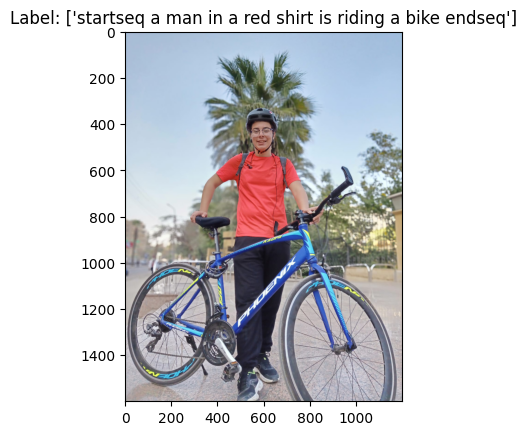

In [ ]:
img, seq, alphas = caption_image_beam_search(encoder, decoder, "/content/test-img.jpg", tokenizer.word_index)
img = img.numpy()
plt.imshow(((img.transpose(1, 2, 0))  * 255).astype(np.uint8))
plt.title(f"Label: { tokenizer.sequences_to_texts([seq])}")
plt.show()

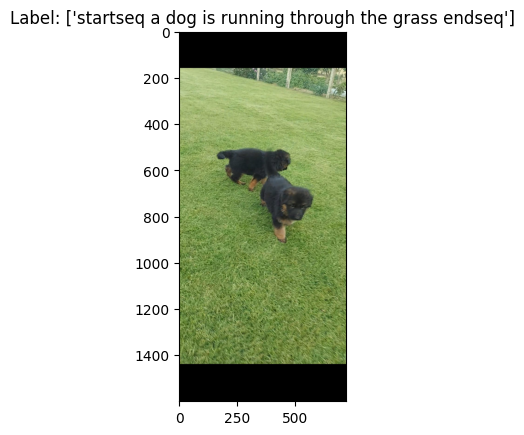

In [ ]:
img, seq, alphas = caption_image_beam_search(encoder, decoder, "/content/img2.jpeg", tokenizer.word_index)
img = img.numpy()
plt.imshow(((img.transpose(1, 2, 0))  * 255).astype(np.uint8))
plt.title(f"Label: { tokenizer.sequences_to_texts([seq])}")
plt.show()

In [ ]:
def visualize_att(image_path, seq, alphas, rev_word_map, smooth=True):
    image = Image.open(image_path)
    image = image.resize([14 * 24, 14 * 24], Image.LANCZOS)

    words = [rev_word_map[ind] for ind in seq]

    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(int(np.ceil(len(words) / 5.)), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_alpha = np.array(alphas)[t, :]
        if smooth:
            alpha = skimage.transform.pyramid_expand(current_alpha, upscale=24, sigma=8)
        else:
            alpha = skimage.transform.resize(current_alpha, [14 * 24, 14 * 24])
        if t == 0:
            plt.imshow(alpha, alpha=0)
        else:
            plt.imshow(alpha, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()

In [ ]:
good_images=["6339824458.jpg", "6341910994.jpg", "6342262756.jpg", "635444010.jpg", "636503038.jpg", "6381062375.jpg", "6386779555.jpg"]
bad_images=["6341526291.jpg", "6342663765.jpg", "6353805299.jpg", "6364640471.jpg", "6372114839.jpg", "6376797975.jpg", "6402183563.jpg", "640409060.jpg", "6414597073.jpg"]

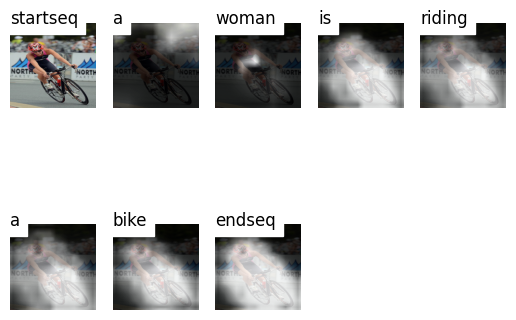

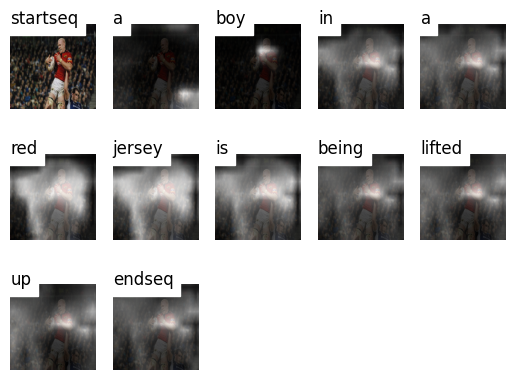

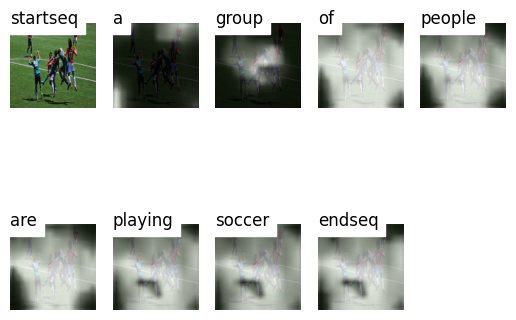

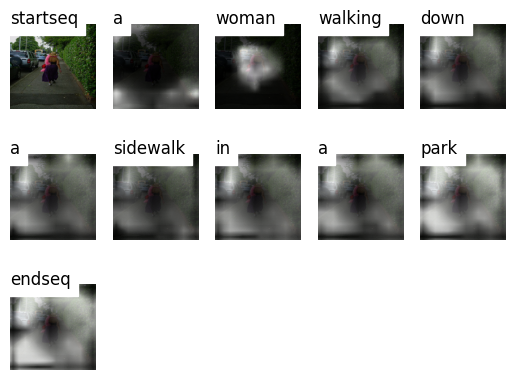

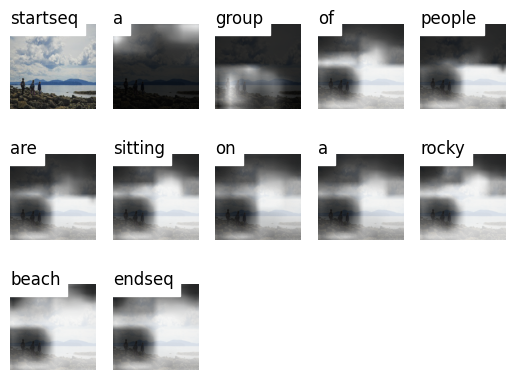

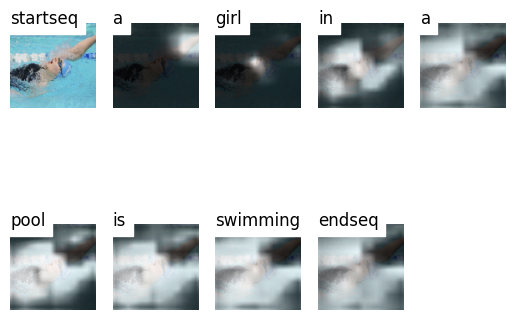

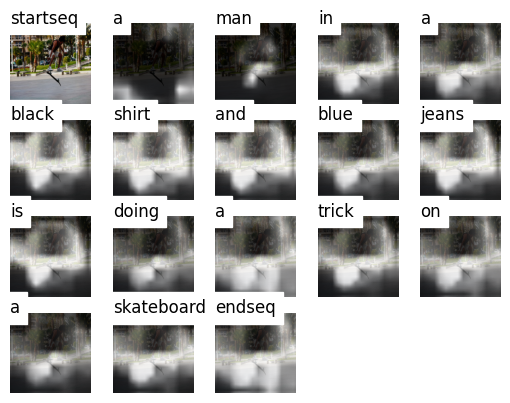

In [ ]:
for img in good_images:
  image_path = "/content/preprocessed_imgs/" + img
  img, seq, alphas = caption_image_beam_search(encoder, decoder, image_path, tokenizer.word_index)
  visualize_att(image_path, seq, alphas, rev_word_map, smooth=False)

##Translate output

In [ ]:
!pip install transformers
!pip install sentencepiece
!pip install arabic-reshaper
!pip install python-bidi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 43.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 70.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 19.3 MB/s eta 0:00:00


In [ ]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from bidi.algorithm import get_display
from arabic_reshaper import reshape

In [ ]:
translationTokenizer = AutoTokenizer.from_pretrained("guymorlan/English2Dialect")
translationModel = AutoModelForSeq2SeqLM.from_pretrained("guymorlan/English2Dialect")

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:194: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


In [ ]:
def getImageArabicCaption(accent, encoder, decoder, image_path, word_map):
  img, seq, alphas = caption_image_beam_search(encoder, decoder, image_path, word_map)
  img = img.numpy()
  plt.imshow(((img.transpose(1, 2, 0))  * 255).astype(np.uint8))
  input_text = tokenizer.sequences_to_texts([seq])[0][9:-7]

  input_ids = translationTokenizer.encode(accent + " " + input_text, return_tensors="pt")
  output_ids = translationModel.generate(input_ids, )
  output_text = translationTokenizer.decode(output_ids[0], skip_special_tokens=True)
  arabic_text = get_display(reshape(output_text))
  plt.title(arabic_text)
  plt.show()
  return arabic_text, alphas

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1346: UserWarning: Using `max_length`'s default (512) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


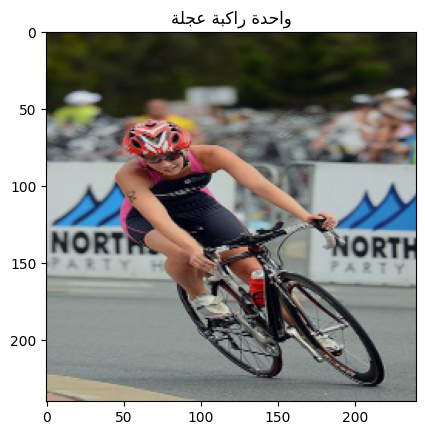

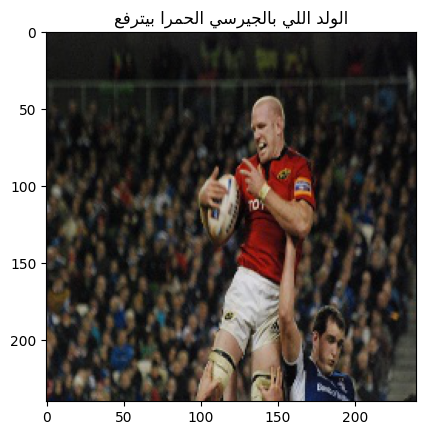

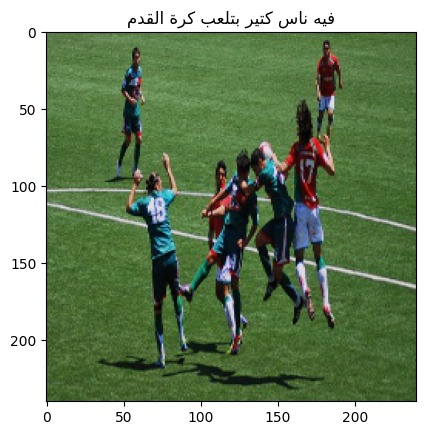

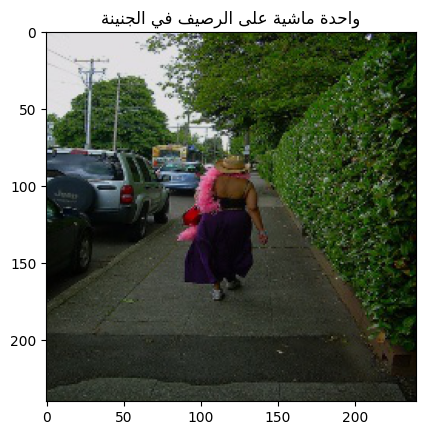

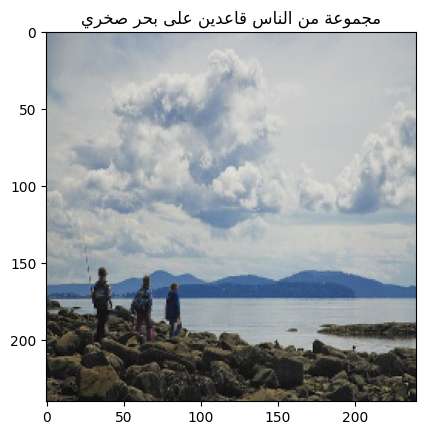

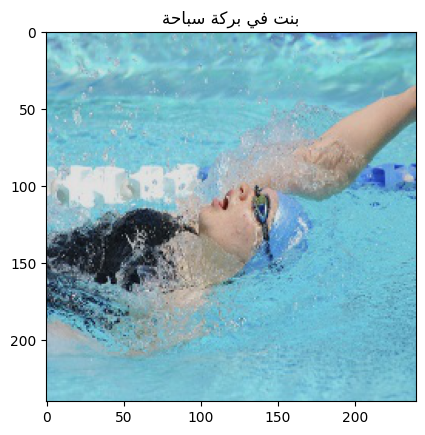

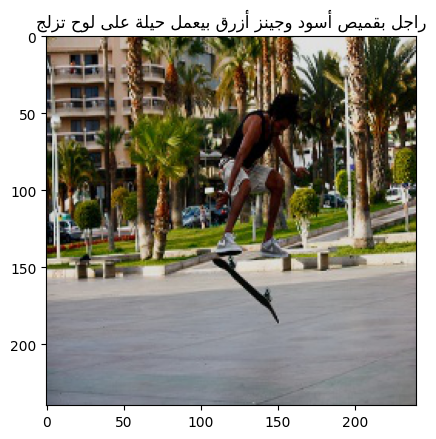

In [ ]:
for img in good_images:
  image_path = "/content/preprocessed_imgs/" + img
  getImageArabicCaption("E", encoder, decoder, image_path, tokenizer.word_index)

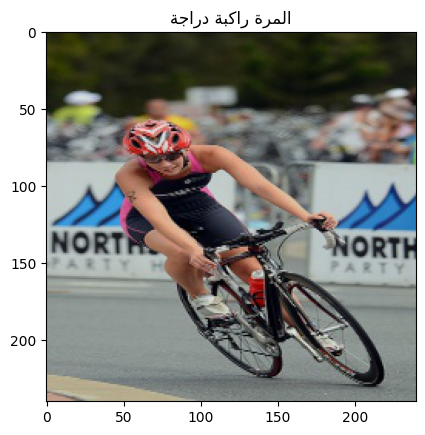

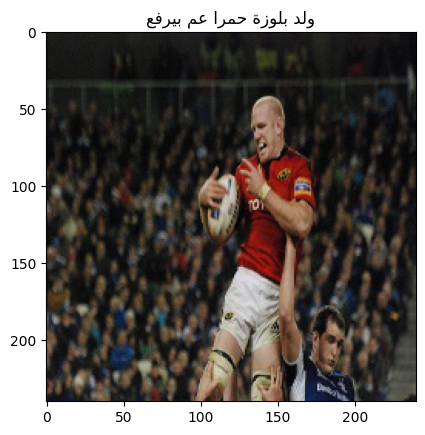

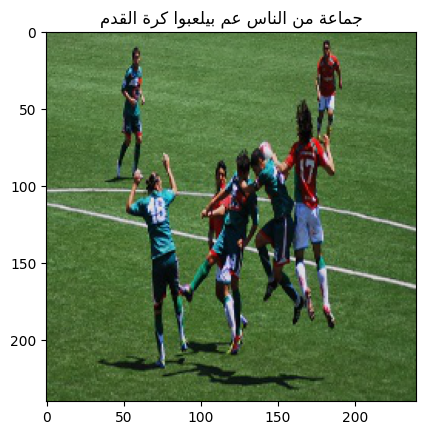

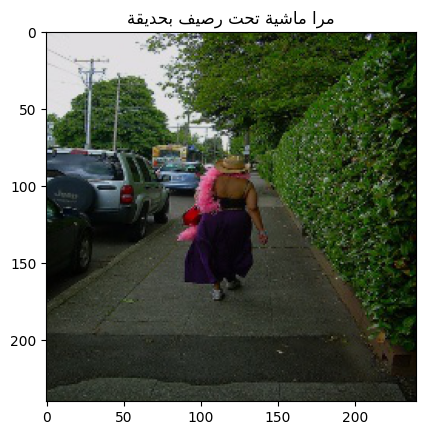

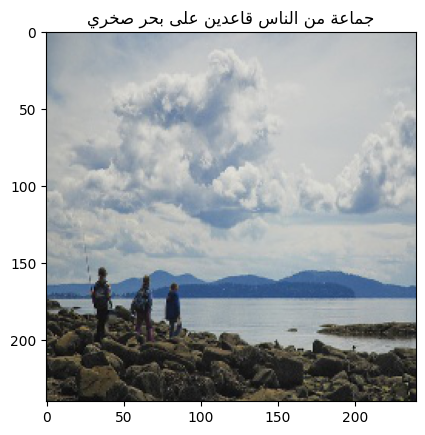

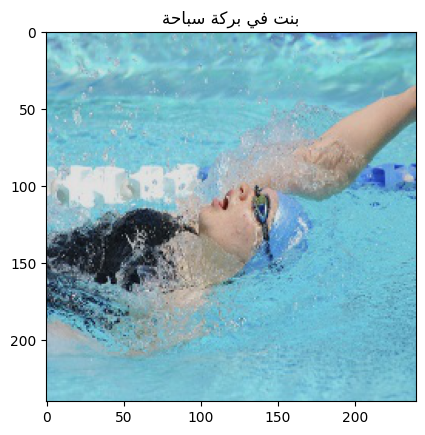

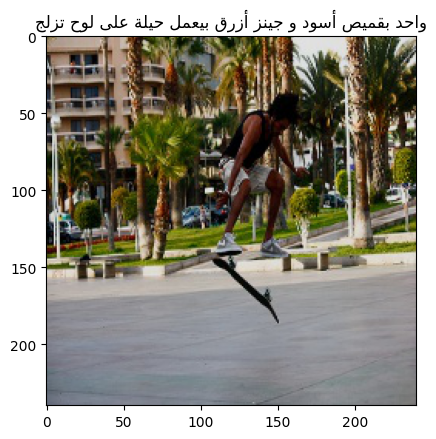

In [ ]:
for img in good_images:
  image_path = "/content/preprocessed_imgs/" + img
  getImageArabicCaption("", encoder, decoder, image_path, tokenizer.word_index)

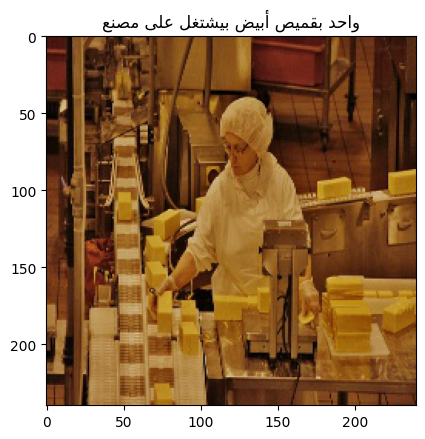

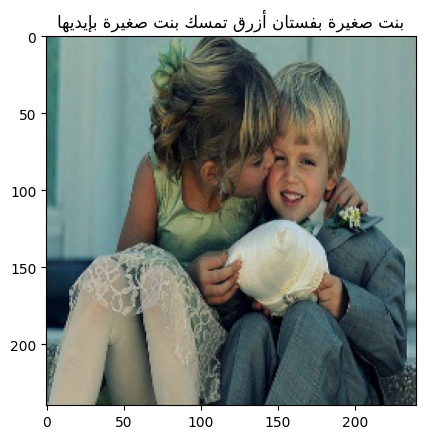

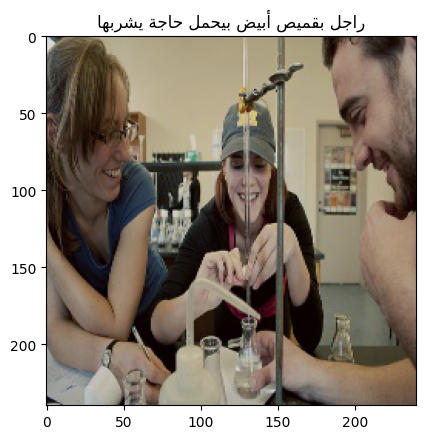

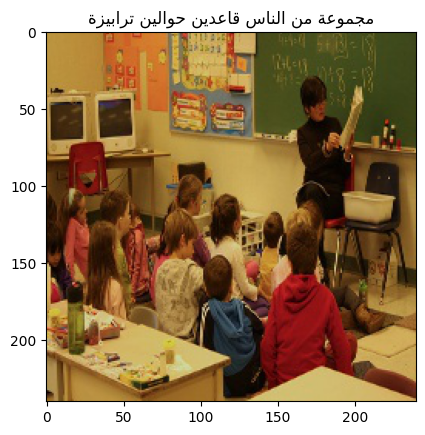

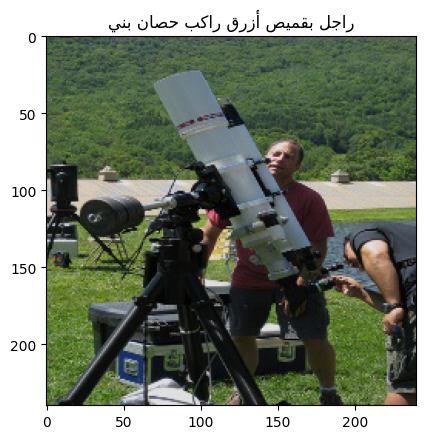

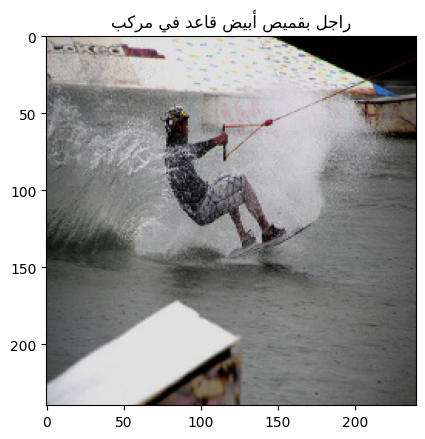

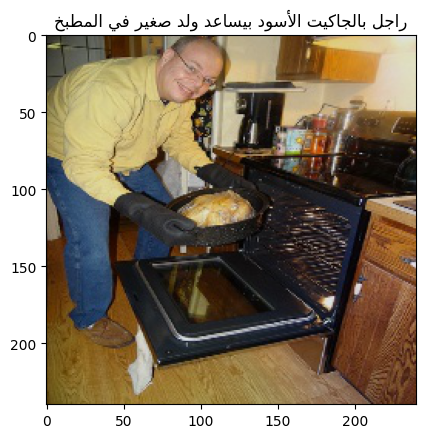

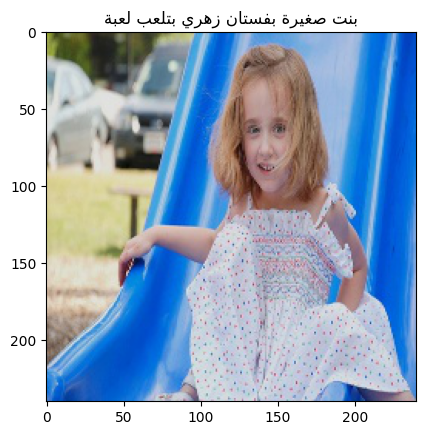

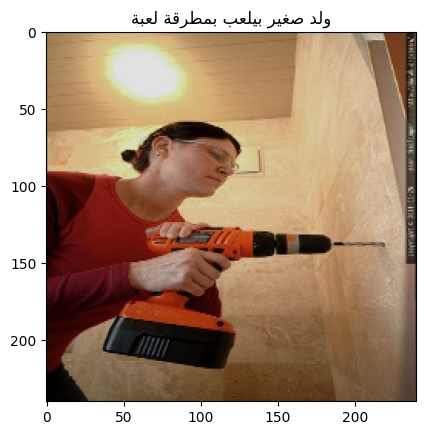

In [ ]:
for img in bad_images:
  image_path = "/content/preprocessed_imgs/" + img
  getImageArabicCaption(encoder, decoder, image_path, tokenizer.word_index)

In [ ]:
def visualize_att(image_path, seq, alphas, rev_word_map, smooth=True):
    image = Image.open(image_path)
    image = image.resize([14 * 24, 14 * 24], Image.LANCZOS)

    words = seq.split()

    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(int(np.ceil(len(words) / 5.)), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_alpha = np.array(alphas)[t, :]
        if smooth:
            alpha = skimage.transform.pyramid_expand(current_alpha, upscale=24, sigma=8)
        else:
            alpha = skimage.transform.resize(current_alpha, [14 * 24, 14 * 24])
        if t == 0:
            plt.imshow(alpha, alpha=0)
        else:
            plt.imshow(alpha, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()

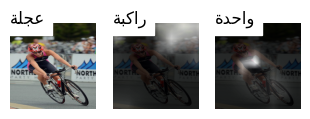

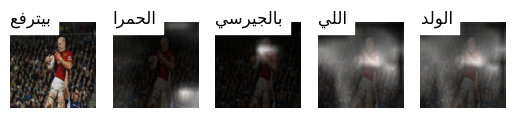

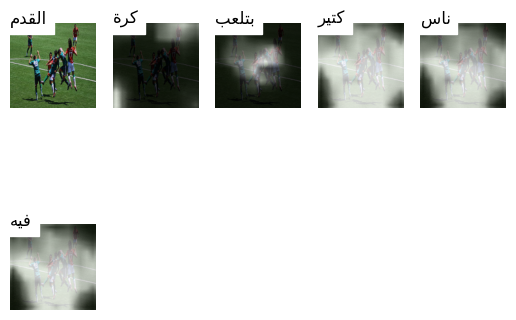

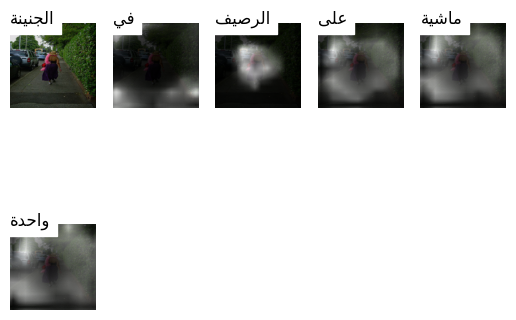

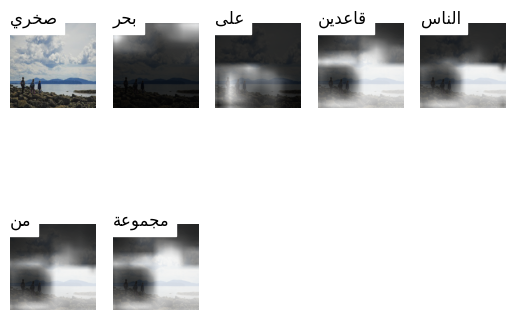

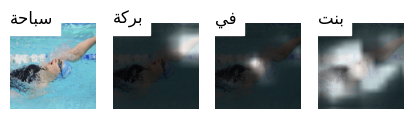

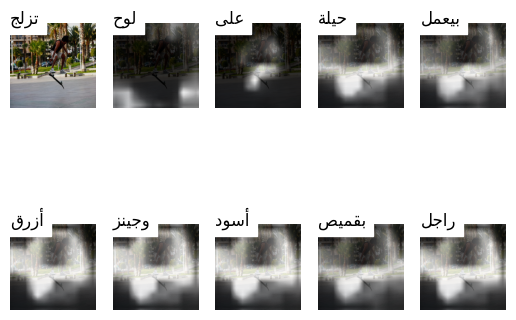

In [ ]:
for img in good_images:
  image_path = "/content/preprocessed_imgs/" + img
  img, seq, alphas = caption_image_beam_search(encoder, decoder, image_path, tokenizer.word_index)
  img = img.numpy()
  input_text = tokenizer.sequences_to_texts([seq])[0][9:-7]
  input_ids = translationTokenizer.encode("E " + input_text, return_tensors="pt")
  output_ids = translationModel.generate(input_ids, )
  output_text = translationTokenizer.decode(output_ids[0], skip_special_tokens=True)
  arabic_text = get_display(reshape(output_text))
  visualize_att(image_path, arabic_text, alphas, rev_word_map, smooth=False)